# 자율주행 보조장치

### 데이터셋
* tensorflow_datasets 에서 제공하는 KITTI 데이터셋
* 자율주행을 위한 데이터셋으로 2D object detection 뿐만 아니라 깊이까지 포함한 3D object detection 라벨 등을 제공한다.

In [1]:
# Tensorflow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

import tensorflow_datasets as tfds

import copy
import cv2
from PIL import Image, ImageDraw

In [3]:
import urllib3
urllib3.disable_warnings()

data_dir = os.path.join(os.getenv("HOME"), 'aiffel/object_detection/data')

(ds_train, ds_test),ds_info = tfds.load(
    'kitti',
    data_dir = data_dir,
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

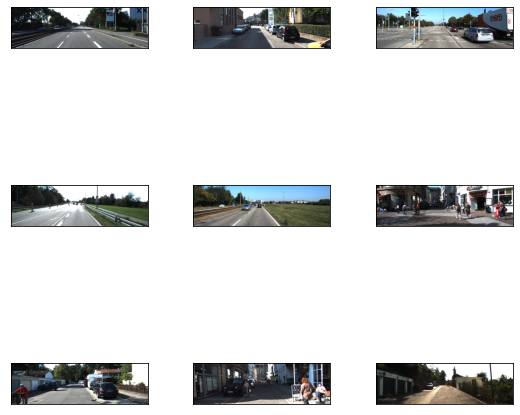

In [4]:
_ = tfds.show_examples(ds_train,ds_info)

In [5]:
ds_info

tfds.core.DatasetInfo(
    name='kitti',
    full_name='kitti/3.2.0',
    description="""
    Kitti contains a suite of vision tasks built using an autonomous driving
    platform. The full benchmark contains many tasks such as stereo, optical flow,
    visual odometry, etc. This dataset contains the object detection dataset,
    including the monocular images and bounding boxes. The dataset contains 7481
    training images annotated with 3D bounding boxes. A full description of the
    annotations can be found in the readme of the object development kit readme on
    the Kitti homepage.
    """,
    homepage='http://www.cvlibs.net/datasets/kitti/',
    data_path='/aiffel/aiffel/object_detection/data/kitti/3.2.0',
    download_size=11.71 GiB,
    dataset_size=5.27 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/file_name': Text(shape=(), dtype=tf.string),
        'objects': Sequence({
            'alpha': tf.float32,
     

------Example------
['image', 'image/file_name', 'objects']
------objects------
{'alpha': <tf.Tensor: shape=(4,), dtype=float32, numpy=array([-1.07, -0.77, -0.48,  2.8 ], dtype=float32)>, 'bbox': <tf.Tensor: shape=(4, 4), dtype=float32, numpy=
array([[0.00402667, 0.62980676, 0.48784   , 0.8803382 ],
       [0.11941333, 0.510934  , 0.496     , 0.771562  ],
       [0.27005333, 0.34356683, 0.49133334, 0.51190823],
       [0.31408   , 0.27432367, 0.5222667 , 0.41886473]], dtype=float32)>, 'dimensions': <tf.Tensor: shape=(4, 3), dtype=float32, numpy=
array([[1.39, 1.59, 3.17],
       [1.46, 1.55, 4.28],
       [1.49, 1.66, 4.16],
       [1.85, 1.68, 4.34]], dtype=float32)>, 'location': <tf.Tensor: shape=(4, 3), dtype=float32, numpy=
array([[ 3.39,  1.62,  7.39],
       [ 2.51,  1.71,  9.56],
       [-1.67,  1.92, 15.51],
       [-4.78,  2.04, 19.3 ]], dtype=float32)>, 'occluded': <tf.Tensor: shape=(4,), dtype=int64, numpy=array([0, 1, 0, 1])>, 'rotation_y': <tf.Tensor: shape=(4,), dtype=flo

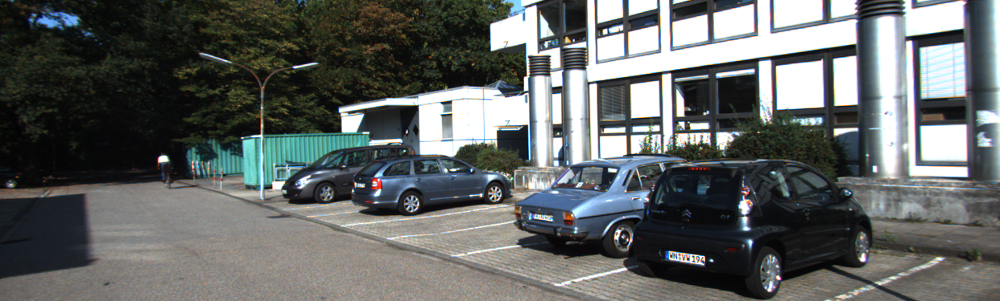

In [6]:
sample = ds_train.take(1)

for example in sample:  
    print('------Example------')
    print(list(example.keys())) # example is `{'image': tf.Tensor, 'label': tf.Tensor}`
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('------objects------')
print(objects)

img = Image.fromarray(image.numpy())
img

width: 1242 height: 375
(4, 4)
[ 782.22  373.49 1093.38  192.06]
[634.58    330.22    958.27997 189.     ]
[426.71002 273.73    635.79004 190.75   ]
[340.71 257.22 520.23 179.15]
<PIL.Image.Image image mode=RGB size=1242x375 at 0x7F9FDC60DF50>


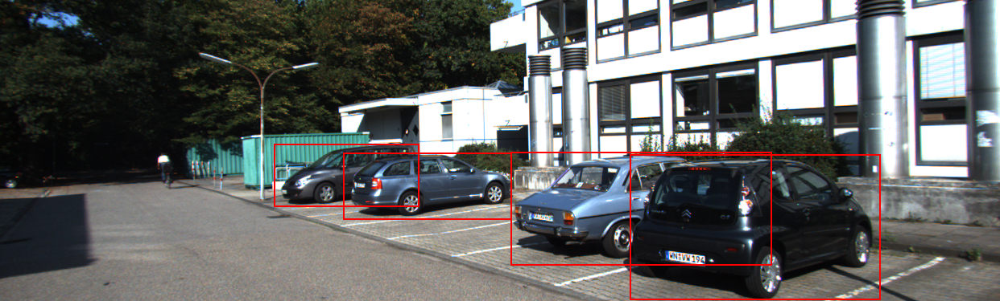

In [7]:
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)
    
    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
    print('width:', width, 'height:', height)
    print(object_bbox.shape)
    x_min = object_bbox[:, 1] * width
    x_max = object_bbox[:, 3] * width
    y_min = height - object_bbox[:, 0] * height
    y_max = height - object_bbox[:, 2] * height
    
    # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    for _rect in rects:
        print(_rect)
        draw.rectangle(_rect, outline=(255,0,0), width=2)
    print(input_image)
    return input_image

visualize_bbox(img, objects['bbox'].numpy())

## RetinaNet
* 1-stage detector 모델인 YOLO와 SSD는 2-stage detector인 Faster-RCNN 등보다 속도는 빠르지만 성능이 낮은 문제를 가지고 있기에 RetinaNet에서는 focal loss와 FPN(Feature Pyramid Network) 를 적용한 네트워크를 사용함.
* Detection 모델을 직접 만들기에는 많은 시간이 소요되기 때문에, 미리 모델을 구현한 라이브러리를 가져와 커스텀 데이터셋에 학습시키고 빠르게 사용할 것.
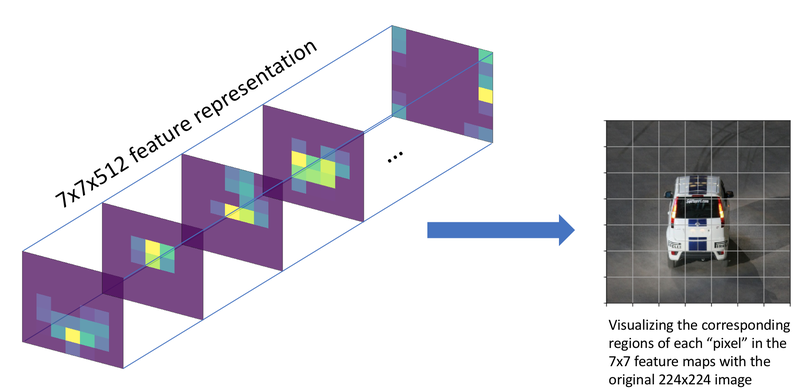
### Focal Loss
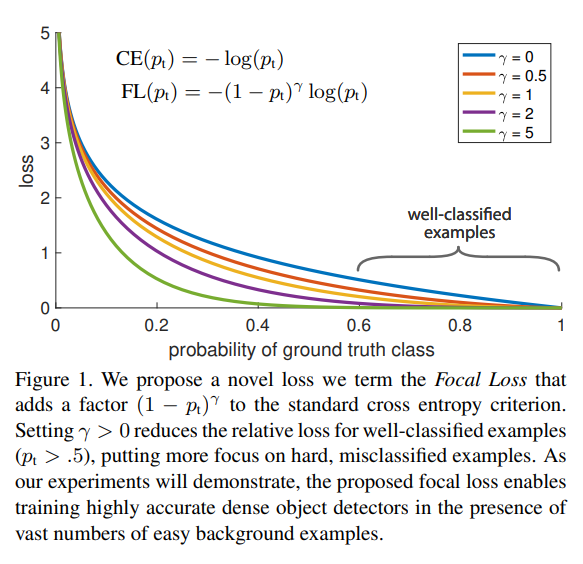
#### 관련 논문
* 기존의 1-stage detection 모델들(YOLO, SSD)이 물체 전경과 배경을 담고 있는 모든 그리드(grid)에 대해 한 번에 학습됨으로 인해서 생기는 클래스 간의 불균형을 해결하고자 도입됨.
* 사용하는 이미지는 물체보다는 많은 배경을 학습하게 되는데 이를 해결하기 위해서 Loss를 개선하여 정확도를 높임.
* Focal Loss는 교차 엔트로피를 기반으로 만들어졌음.
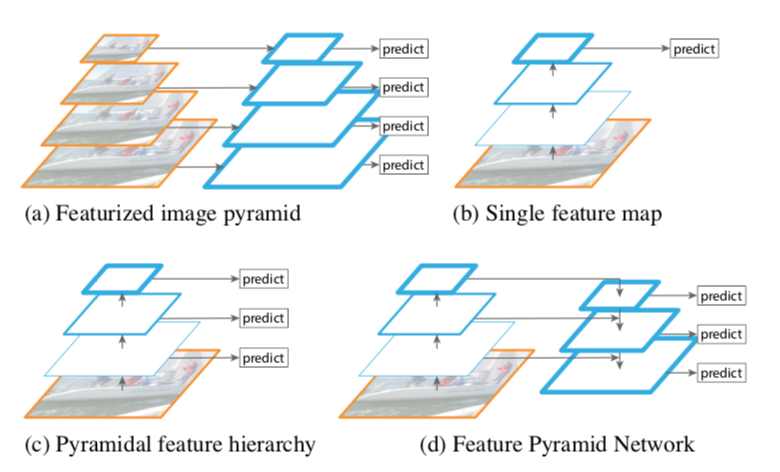
### FPN(Feature Pyramid Network)
* 특성을 피라미드처럼 쌓아서 사용하는 방식.
* 컨볼루션 연산은 커널을 통해 일정한 영역을 보고 몇 개의 숫자로 요약해 내기 때문에, 입력 이미지를 기준으로 생각하면 입력 이미지와 먼 모델의 뒷쪽의 특성 맵일수록 하나의 "셀(cell)"이 넓은 이미지 영역의 정보를 담고 있음.
* 입력 이미지와 가까운 앞쪽 레이어의 특성 맵일수록 좁은 범위의 정보를 담고 있는데 이를 receptive field라고 함.
* 레이어가 깊어질 수록 pooling을 거쳐 넓은 범위의 정보(receptive field)를 갖게 되는 것.
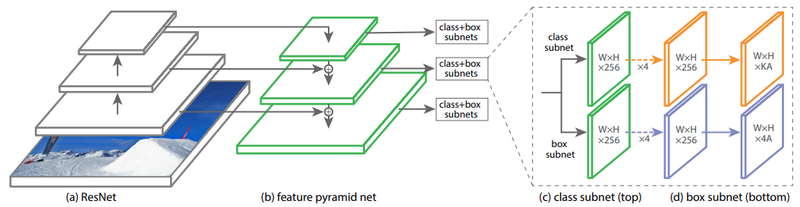
* FPN은 백본의 여러 레이어를 한꺼번에 쓰겠다라는데에 의의가 있음.
## keras-retinanet 실습 (1) 데이터 포맷 변경
* Keras RetinaNet은 케라스(Keras) 라이브러리로 구현된 RetinaNet임.
* 해당 모델을 훈련할 수 있는 공통된 데이터셋 포맷인 CSV 형태로 모델을 변경해주는 방법사용.
### 클래스 및 바운딩 박스 정보 추출
* API를 활용하여 데이터를 추출, 이를 포맷팅 하여 CSV 형태로 한 줄씩 저장.
* 한 라인에 이미지 파일의 위치, 바운딩 박스 위치, 그리고 클래스 정보를 가지는 CSV 파일을 작성 후 csv 파일 생성.

In [8]:
import os
data_dir = os.getenv('HOME') + '/aiffel/object_detection/data'
img_dir = data_dir + '/kitti_images'
train_csv_path = data_dir + '/kitti_train.csv'


def parse_dataset(dataset, img_dir, total=0):
    if not os.path.exists(img_dir):
        os.mkdir(img_dir)
        
    #Dataset의 claas를 확인하여 class에 따른 index를 확인.
    #class를 차와 사람으로 구별함.
    type_class_map = {
        0: "car",
        1: "car",
        2: "car",
        3: "person",
        4: "person",
        5: "person",
    }
    
    #dataset을 csv로 parsing하기 위해서 필요한 column을 가진 pandas.DataFrame을 생성.
    df = pd.DataFrame(columns=["img_path", "x1", "y1", "x2", "y2", "class_name"])
    for item in tqdm(dataset, total=total):
        filename = item['image/file_name'].numpy().decode('utf-8')
        img_path = os.path.join(img_dir, filename)
        
        img = Image.fromarray(item['image'].numpy())
        img.save(img_path)
        object_bbox = item['objects']['bbox']
        object_type = item['objects']['type'].numpy()
        width, height = img.size
        
        #tf.dataset의 bbox좌표가 0과 1사이로 normalize된 좌표이므로 이를 pixel좌표로 변환.
        x_min = object_bbox[:,1] * width
        x_max = object_bbox[:,3] * width
        y_min = height - object_bbox[:,2] * height
        y_max = height - object_bbox[:,0] * height
        
        #한 이미지에 있는 여러 Object들을 한 줄씩 pandas.DataFrame에 append.
        rects = np.stack([x_min, y_min, x_max, y_max], axis=1).astype(np.int)
        for i, _rect in enumerate(rects):
            _type = object_type[i]
            if _type not in type_class_map.keys():
                continue
            df = df.append({
                "img_path": img_path,
                "x1": _rect[0],
                "y1": _rect[1],
                "x2": _rect[2],
                "y2": _rect[3],
                "class_name": type_class_map[_type]
            }, ignore_index=True)
            
    return df
        
df_train = parse_dataset(ds_train, img_dir, total=ds_info.splits['train'].num_examples)
df_train.to_csv(train_csv_path, sep=',', index=False, header=False)

100%|██████████| 6347/6347 [27:41<00:00,  3.82it/s]


In [9]:
#테스트데이터셋도 dataframe 생성
test_csv_path = data_dir + '/kitti_test.csv'

df_test = parse_dataset(ds_test, img_dir, total=ds_info.splits['test'].num_examples)
df_test.to_csv(test_csv_path, sep=',', index=False, header=False)

100%|██████████| 711/711 [03:10<00:00,  3.73it/s]


## 클래스 맵핑
* 모델에게 데이터를 알려줄 때에는 숫자를 사용해 클래스를 표시해야 함.
* 어떤 클래스가 있고 각 클래스가 어떤 인덱스(index)에 맵핑(mapping)될지 미리 정하고 저장해 두어야 학습을 한 후 추론(inference)을 할 때에도 숫자 인덱스로 나온 정보를 클래스 이름으로 바꾸어 해석할 수 있음.

In [10]:
class_txt_path = data_dir + '/classes.txt'

def save_class_format(path):
    class_type_map = {
        "car" : 0,
        "person": 1
    }
    with open(path, mode='w', encoding='utf-8') as f:
        for k, v in class_type_map.items():
            f.write(f"{k},{v}\n")
    print('Done')
            
save_class_format(class_txt_path)

Done


## keras-retinanet 실습 (2) 셋팅

In [11]:
#RetinaNet 훈련
!cd ~/aiffel/object_detection && python keras-retinanet/keras_retinanet/bin/train.py --gpu 0 --multiprocessing --workers 4 --batch-size 2 --epochs 10 --steps 195 csv data/kitti_train.csv data/classes.txt
print("Done")

2021-10-19 10:13:00.467371: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Using TensorFlow backend.
2021-10-19 10:13:02.779864: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-10-19 10:13:02.781231: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-10-19 10:13:02.792486: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0001:00:00.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-10-19 10:13:02.792537: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-10-19 10:13:02.796428: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library 

res3b_branch2b (Conv2D)         (None, None, None, 1 147456      padding3b_branch2b[0][0]         
__________________________________________________________________________________________________
bn3b_branch2b (BatchNormalizati (None, None, None, 1 512         res3b_branch2b[0][0]             
__________________________________________________________________________________________________
res3b_branch2b_relu (Activation (None, None, None, 1 0           bn3b_branch2b[0][0]              
__________________________________________________________________________________________________
res3b_branch2c (Conv2D)         (None, None, None, 5 65536       res3b_branch2b_relu[0][0]        
__________________________________________________________________________________________________
bn3b_branch2c (BatchNormalizati (None, None, None, 5 2048        res3b_branch2c[0][0]             
__________________________________________________________________________________________________
res3b (Add

2021-10-19 10:13:09.195912: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2021-10-19 10:13:09.196532: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2596985000 Hz
Epoch 1/10
2021-10-19 10:13:21.112059: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8
2021-10-19 10:13:22.347714: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2021-10-19 10:13:22.396014: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2021-10-19 10:13:23.156127: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2021-10-19 10:13:23.432764: I tensor

In [12]:
#학습된 모델을 추론을 위해 실행할 수 있는 케라스 모델로 변환
!cd ~/aiffel/object_detection && python keras-retinanet/keras_retinanet/bin/convert_model.py snapshots/resnet50_csv_10.h5 snapshots/resnet50_csv_10_infer.h5
print("Done")

2021-10-19 10:52:41.494027: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-10-19 10:52:43.543528: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-10-19 10:52:43.544788: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-10-19 10:52:43.554463: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0001:00:00.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-10-19 10:52:43.554526: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-10-19 10:52:43.558939: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2021-10-19

## keras-retinanet 실습 (3) 시각화

In [13]:
%matplotlib inline

#automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2


import keras
from keras_retinanet import models
from keras_retinanet.models import load_model
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet.utils.gpu import setup_gpu

import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

gpu = '0'
setup_gpu(gpu)

dir_path = os.getenv('HOME') + '/aiffel/object_detection/'
model_path = os.path.join(dir_path, 'snapshots', 'resnet50_csv_10_infer.h5')
model = load_model(model_path, backbone_name='resnet50')

Physical devices cannot be modified after being initialized
1 Physical GPUs, 1 Logical GPUs


Using TensorFlow backend.


[177.1391  130.42009 356.22867 231.33965]
[593.44824 172.73973 622.6148  205.01566]
[371.12265 182.72911 417.91724 209.2761 ]
[441.18967 170.5793  473.7889  196.1463 ]
[530.59766 158.68056 561.1737  190.82494]
[429.8745  175.85483 468.70767 199.89201]


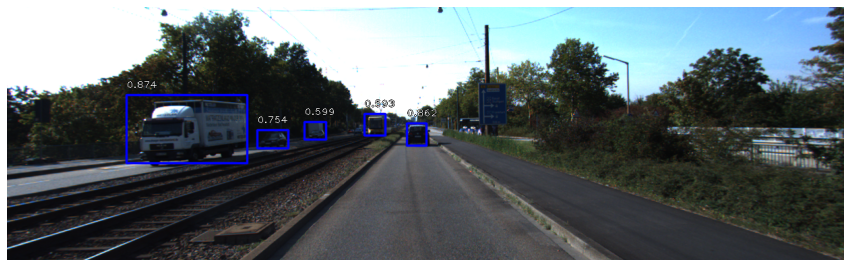

In [15]:
#결과 확인 함수
import os
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/go_1.png'

#inference_on_image 함수
def inference_on_image(model, img_path, visualize=True):
    image = read_image_bgr(img_path)

    #copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    color_map = {
        0: (0, 0, 255), # blue
        1: (255, 0, 0) # red
    }

    #preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    #process image
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    #correct for image scale
    boxes /= scale

    #display images
    if  visualize:
        for box, score, label in zip(boxes[0], scores[0], labels[0]):
            print(box)
            if score < 0.5:
                break
            b = box.astype(int)
            draw_box(draw, b, color=color_map[label])

            caption = "{:.3f}".format(score)
            draw_caption(draw, b, caption)

        plt.figure(figsize=(15, 15))
        plt.axis('off')
        plt.imshow(draw)
        plt.show()            

inference_on_image(model, img_path)

[776.12213 139.3326  851.4926  314.84177]
[746.311   118.97006 883.51276 316.9327 ]


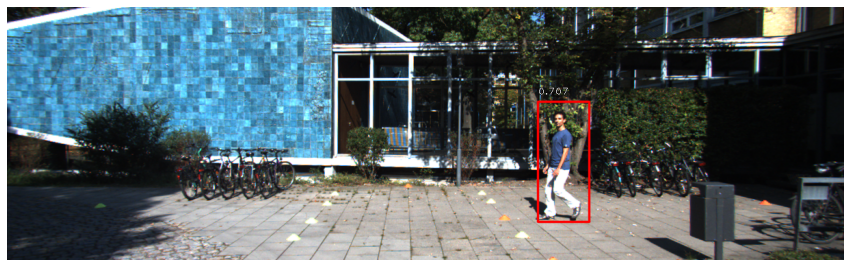

In [16]:
#다른 이미지도 확인
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/stop_1.png'
inference_on_image(model, img_path)

# Project : 자율주행 보조 시스템 만들기

In [17]:
def self_drive_assist(model, img_path, size_limit=300, visualize=True):
    image = read_image_bgr(img_path)

    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    color_map = {
        0: (0, 0, 255), 
        1: (255, 0, 0)  
    }

    image = preprocess_image(image)
    image, scale = resize_image(image)

    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    boxes /= scale

    #시각화
    if visualize:
        result = 'Go'
        for box, score, label in zip(boxes[0], scores[0], labels[0]):
            print(box)
            if score < 0.65:  #0.65 이하는 제외
                break
            b = box.astype(int)
            w = b[2]-b[0]
            h = b[3]-b[1]
            
            if w >= size_limit or h >= size_limit or label == 1:
                result = 'Stop'
            else:
                result = 'Go'
            
            draw_box(draw, b, color=color_map[label])

            caption = "{:.3f}".format(score)
            draw_caption(draw, b, caption)

        plt.figure(figsize=(15, 15))
        plt.axis('off')
        plt.imshow(draw)
        plt.show()
        
        return result

[776.12213 139.3326  851.4926  314.84177]
[746.311   118.97006 883.51276 316.9327 ]


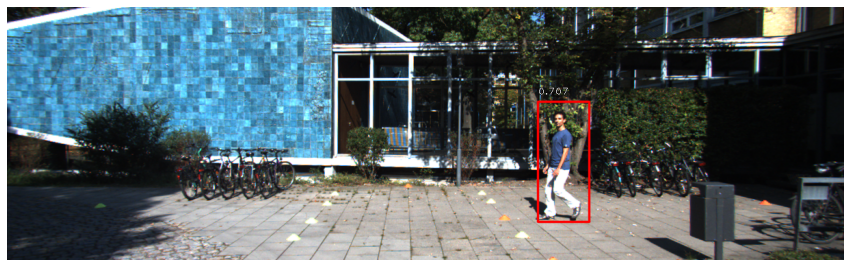

Stop


In [18]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/stop_1.png'

print(self_drive_assist(model=model, img_path=img_path))

## 자율주행 시스템 평가하기

In [19]:
import os

def test_system(func):
    work_dir = os.getenv('HOME')+'/aiffel/object_detection'
    score = 0
    test_set=[
        ("test_set/stop_1.png", "Stop"),
        ("test_set/stop_2.png", "Stop"),
        ("test_set/stop_3.png", "Stop"),
        ("test_set/stop_4.png", "Stop"),
        ("test_set/stop_5.png", "Stop"),
        ("test_set/go_1.png", "Go"),
        ("test_set/go_2.png", "Go"),
        ("test_set/go_3.png", "Go"),
        ("test_set/go_4.png", "Go"),
        ("test_set/go_5.png", "Go"),
    ]

    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = self_drive_assist(model=model, img_path=image_path)
        print(image_file)
        print(f'prediction: {pred}, answer: {answer}\n')
        if pred == answer:
            score += 10
    print(f"결과: {score}점입니다.")

[776.12213 139.3326  851.4926  314.84177]
[746.311   118.97006 883.51276 316.9327 ]


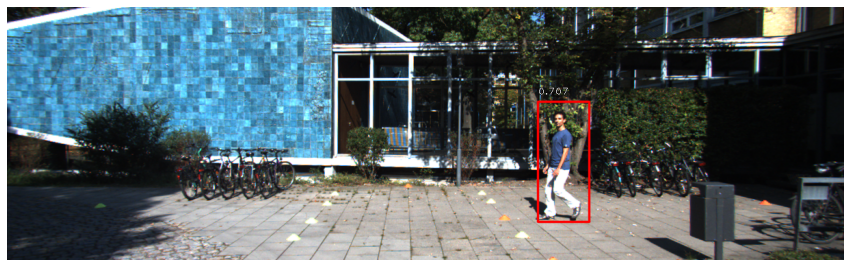

test_set/stop_1.png
prediction: Stop, answer: Stop

[424.32556 162.19464 497.7337  336.47537]
[395.4671  153.12503 479.6552  326.4483 ]


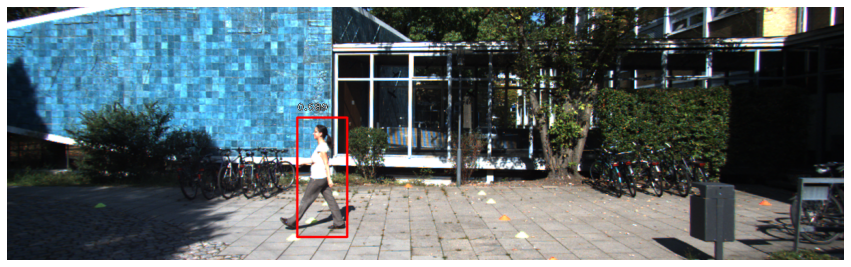

test_set/stop_2.png
prediction: Stop, answer: Stop

[  0.      191.02306 303.66205 369.12827]
[746.0212  159.35004 874.29254 207.60565]
[ 998.0577   144.5641  1034.3369   219.29959]


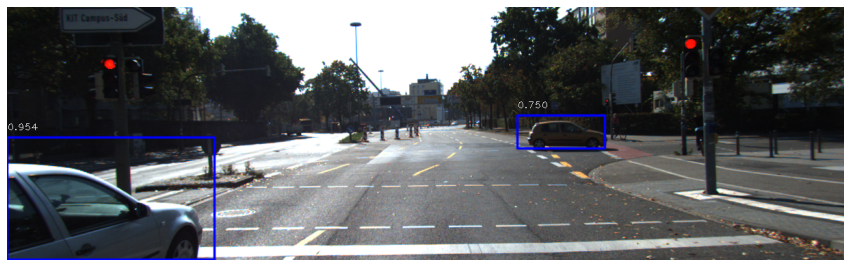

test_set/stop_3.png
prediction: Go, answer: Stop

[649.64575 135.09126 729.11847 220.99783]
[ 692.11676    60.162544 1086.1617    350.64694 ]
[433.3623  158.55534 547.37103 204.93617]
[ 26.318335 147.25848  371.86115  317.45493 ]
[348.71307 171.37666 474.32135 219.77937]
[661.36774 131.2828  762.6132  237.59831]
[389.02725 166.70663 526.3938  213.45592]
[655.6227  157.0691  712.1116  216.56856]


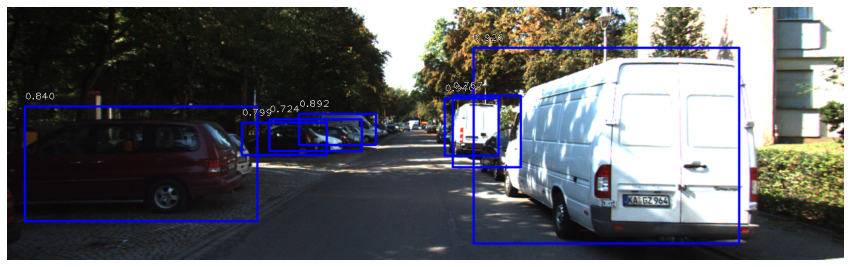

test_set/stop_4.png
prediction: Go, answer: Stop

[ 887.7507   176.18631 1241.0684   372.85394]
[566.2038  179.01031 614.80176 213.96738]
[729.94415 162.49057 858.6283  249.45293]
[693.6768  143.60005 756.7154  209.33275]
[699.795   146.40335 800.4537  225.53806]


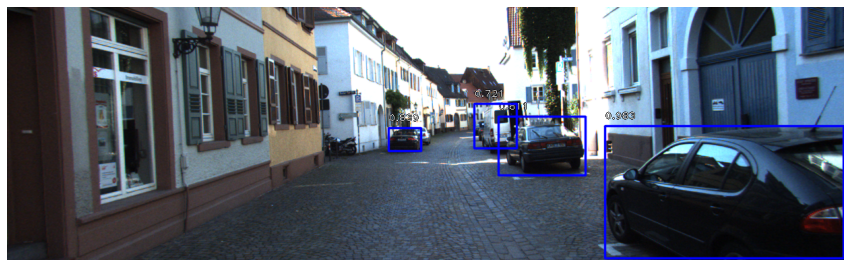

test_set/stop_5.png
prediction: Go, answer: Stop

[177.1391  130.42009 356.22867 231.33965]
[593.44824 172.73973 622.6148  205.01566]
[371.12265 182.72911 417.91724 209.2761 ]
[441.18967 170.5793  473.7889  196.1463 ]


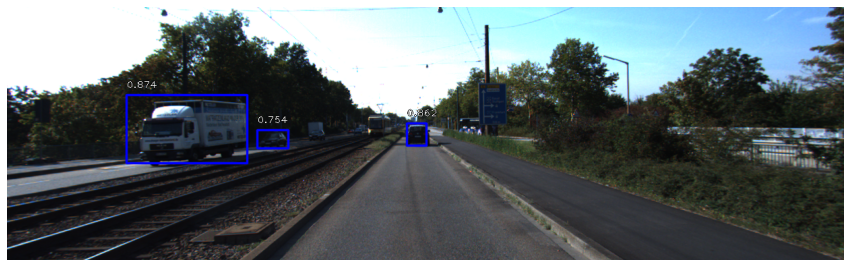

test_set/go_1.png
prediction: Go, answer: Go

[515.11676 176.86115 565.5376  214.24559]
[628.8195  174.5921  663.7687  210.34558]
[529.3528  175.87195 575.12964 207.12422]


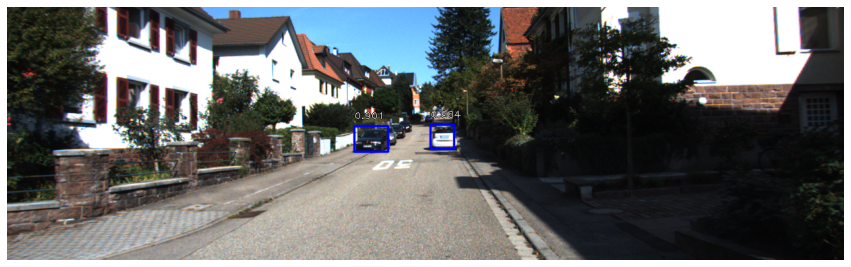

test_set/go_2.png
prediction: Go, answer: Go

[820.6889  151.88416 878.0081  178.13441]
[541.1677  166.81898 569.5694  192.01115]


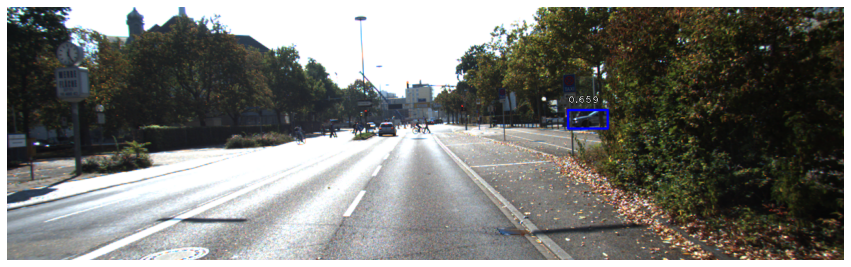

test_set/go_3.png
prediction: Go, answer: Go

[689.4135  173.85258 790.2781  255.28587]
[718.22626 168.45377 761.54956 198.81752]


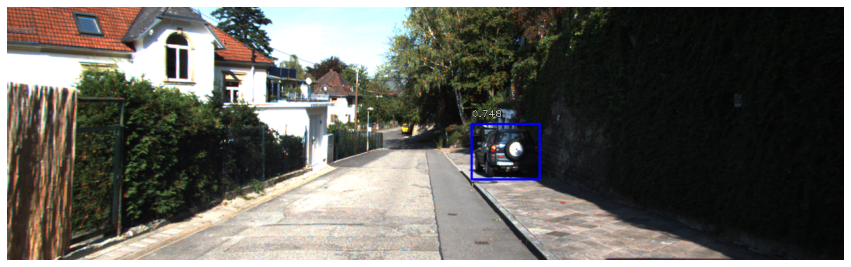

test_set/go_4.png
prediction: Go, answer: Go

[  0.      181.31294 225.09196 310.7717 ]
[150.08974 179.48973 347.67438 255.71042]
[345.07608 178.4687  434.96432 220.75502]


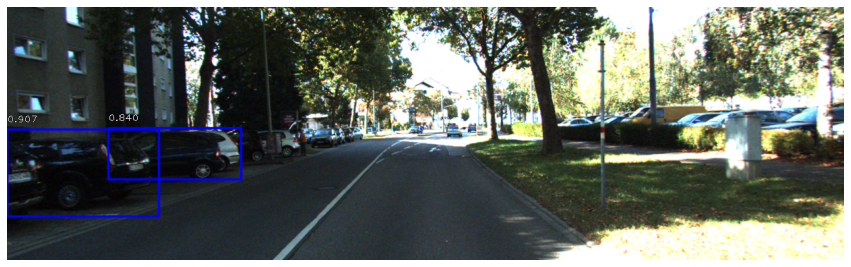

test_set/go_5.png
prediction: Go, answer: Go

결과: 70점입니다.


In [20]:
test_system(self_drive_assist)